In [1]:
import scanpy as sc
import numpy as np
import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics.cluster import adjusted_rand_score
import os
import scipy.sparse as sparse
import anndata

import seaborn as sns
from utils import refine, record_memory_usage
import time

sc.logging.print_header()
# sc.logging.print_versions()
sc.set_figure_params(facecolor="white", figsize=(8, 8))
sc.settings.verbosity = 3 # errors (0), warnings (1), info (2), hints (3)

sns.set_style("white")

np.random.seed(0)

scanpy==1.9.6 anndata==0.10.3 umap==0.5.4 numpy==1.26.0 scipy==1.11.3 pandas==2.1.3 scikit-learn==1.3.2 statsmodels==0.14.0 igraph==0.11.2 louvain==0.8.1 pynndescent==0.5.11


In [2]:
section_id = '151675'
adata = sc.read_visium(path='Data/151675', count_file=section_id + '_filtered_feature_bc_matrix.h5')
adata.var_names_make_unique()

reading Data\151675\151675_filtered_feature_bc_matrix.h5
 (0:00:00)


In [3]:
sc.pp.filter_genes(adata, min_cells=10)
sc.pp.highly_variable_genes(adata, flavor='seurat_v3', n_top_genes=3000)
hvg_filter = adata.var['highly_variable']
sc.pp.normalize_total(adata, inplace=True)
adata_all_genes = adata.copy()
adata = adata[:, hvg_filter]
display(adata)

filtered out 17476 genes that are detected in less than 10 cells
If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)
normalizing counts per cell
    finished (0:00:00)


View of AnnData object with n_obs × n_vars = 3592 × 3000
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'spatial', 'hvg'
    obsm: 'spatial'

### We determine that in 10 $\times$ dataset, all spot to its neighbors is the same distance



Median distance to closest cell = 138.00362314084367

Edge weights (distance between cells): median = 138.00362314084367, mode = 137.00364958642524


Edge weights (weights between cells): median = 0.16670164151558636, mode = 0.16612198117491883


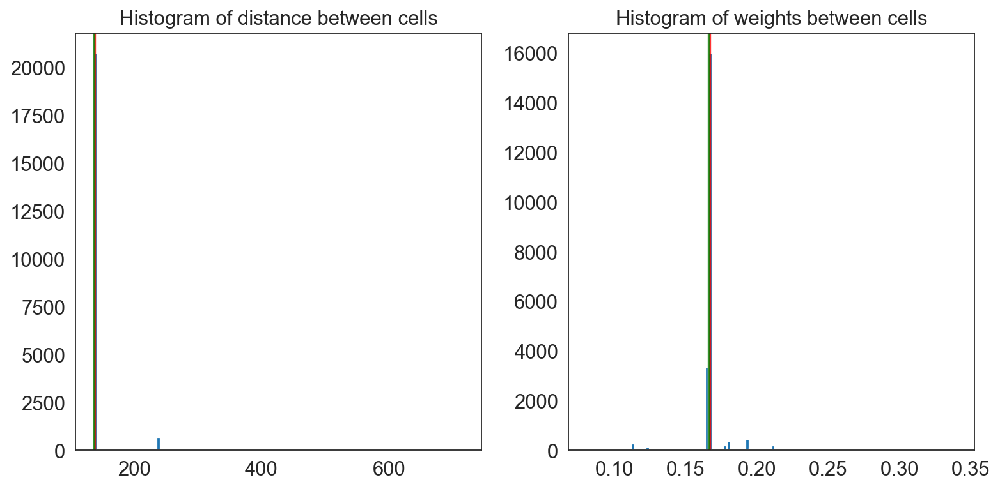

In [4]:

from sklearn.neighbors import NearestNeighbors
from utils import plot_edge_histogram, generate_spatial_weights_fixed_nbrs

num_neighbours = 6
nbrs = NearestNeighbors(algorithm='ball_tree').fit(adata.obsm['spatial'])
distances, indices = nbrs.kneighbors(n_neighbors=num_neighbours)
median_cell_distance = np.median(distances)
print(f"\nMedian distance to closest cell = {median_cell_distance}")

# 将细胞间距离以直方图的形式给出
weights_graph, distance_graph = generate_spatial_weights_fixed_nbrs(adata.obsm['spatial'], num_neighbours=num_neighbours, decay_type='reciprocal', nbr_object=nbrs, verbose=False)
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))
plot_edge_histogram(distance_graph, ax[0], title='distance between cells')
plot_edge_histogram(weights_graph, ax[1], title='weights between cells')
fig.tight_layout()

#### Inspired by BANKSY, we use neighbor spots' expression to enhance current spot:
$$
current_count = [count; \alpha * Neigh\_Count]
$$
it means, if expression count file $X \in R^{n * m}$, after enhance, it will be $\hat{X} \in R^{n * 2m}$

In [5]:
from utils import weighted_concatenate, zscore, matrix_to_adata

gene_list = adata.var.index

nbrhood_contribution = 0.2

neighbour_agg_matrix = weights_graph @ adata.X

if sparse.issparse(adata.X):
    concatenated = sparse.hstack((adata.X, neighbour_agg_matrix), )
else:
    concatenated = np.concatenate((adata.X, neighbour_agg_matrix), axis=1,)

matrix = weighted_concatenate(zscore(adata.X, axis=0), zscore(neighbour_agg_matrix, axis=0), nbrhood_contribution)


if sparse.issparse(matrix):
    st_dev_pergene = matrix.toarray().std(axis=0)
else:
    st_dev_pergene = matrix.std(axis=0)

enhanced_data = matrix_to_adata(matrix, adata)
display(enhanced_data)

num_nbrs: 3000


AnnData object with n_obs × n_vars = 3592 × 6000
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'is_nbr'
    uns: 'spatial', 'hvg'
    obsm: 'spatial'

In [6]:
enhanced_data.obs['Ground Truth'] = pd.read_csv(os.path.join('Data', section_id, section_id + '_truth.txt'), sep='\t', header=None, index_col=0)

In [7]:
start_time = time.time()
sc.pp.pca(enhanced_data, n_comps=100)
low_dim_x = enhanced_data.obsm['X_pca']

computing PCA
    on highly variable genes
    with n_comps=100
    finished (0:00:02)


In [8]:
sc.pp.pca(adata, n_comps=50)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)


In [9]:
from sklearn.cluster import SpectralClustering
from sklearn.neighbors import kneighbors_graph
from sklearn.metrics.pairwise import cosine_similarity

n_spot = low_dim_x.shape[0]
n_neighbor = 15
init_W = cosine_similarity(low_dim_x)
cos_init = np.zeros((n_spot, n_spot))
for i in range(n_spot):
    vec = init_W[i, :]
    distance = vec.argsort()[:: -1]
    for t in range(n_neighbor + 1):
        y = distance[t]
        cos_init[i, y] = init_W[i, y]

In [10]:
from network import sparse_self_representation

C = sparse_self_representation(low_dim_x.T, init_w=cos_init, alpha=1, beta=1)

# Epoch 99, loss: 862.586: 100%|██████████| 100/100 [02:17<00:00,  1.38s/it]


In [11]:
from MNMST import MNMST_representation
Z = MNMST_representation(C, weights_graph)
end_time = time.time()

# Epoch 28, loss: 0.120:  29%|██▉       | 29/100 [02:27<06:00,  5.08s/it] 


In [12]:
elapsed_time_minutes = (end_time - start_time) / 60
final_memory_usage_gb = record_memory_usage()
print(f"time executing is: {elapsed_time_minutes:.2f} mins")
print(f"memory executing is: {final_memory_usage_gb:.2f} GB")

time executing is: 4.82 mins
memory executing is: 2.00 GB


### We first perform spectral clustering on the learned affinity graph to visual the performance, and fianlly perform leiden to achieve target domains

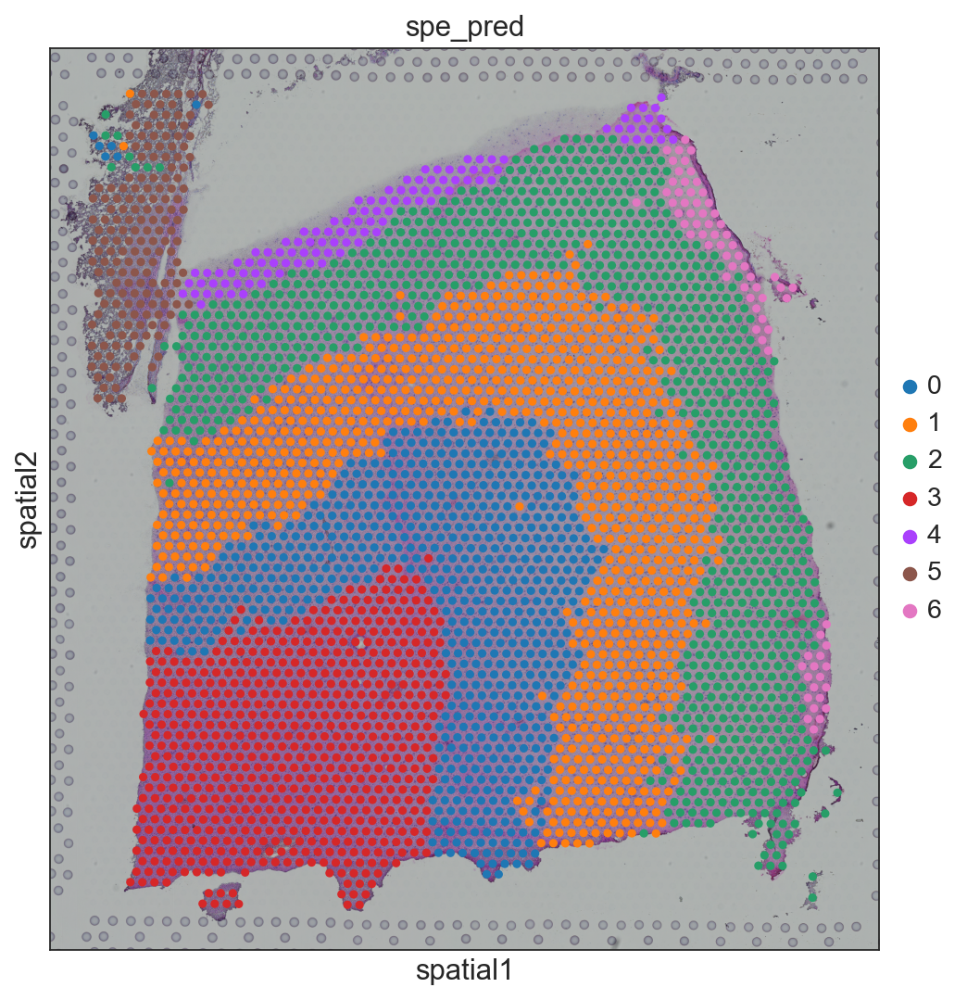

In [13]:
from sklearn.cluster import SpectralClustering

n_clusters = 7  # 你可以根据需要设置聚类的数量
spectral = SpectralClustering(n_clusters=n_clusters, affinity='precomputed')
labels = spectral.fit_predict(Z)

enhanced_data.obs['spe_pred'] = labels
enhanced_data.obs["spe_pred"] = enhanced_data.obs["spe_pred"].astype('int')
enhanced_data.obs['spe_pred'] = enhanced_data.obs['spe_pred'].astype('category')
sc.pl.spatial(enhanced_data, color=['spe_pred'])

running Leiden clustering
    finished: found 7 clusters and added
    'MNMST_CPU', the cluster labels (adata.obs, categorical) (0:00:23)


AAACAACGAATAGTTC-1    5
AAACAAGTATCTCCCA-1    0
AAACACCAATAACTGC-1    1
AAACAGAGCGACTCCT-1    4
AAACAGGGTCTATATT-1    2
                     ..
TTGTTGTGTGTCAAGA-1    3
TTGTTTCACATCCAGG-1    1
TTGTTTCATTAGTCTA-1    1
TTGTTTCCATACAACT-1    2
TTGTTTGTATTACACG-1    1
Name: MNMST_CPU, Length: 3592, dtype: category
Categories (7, object): ['0', '1', '2', '3', '4', '5', '6']

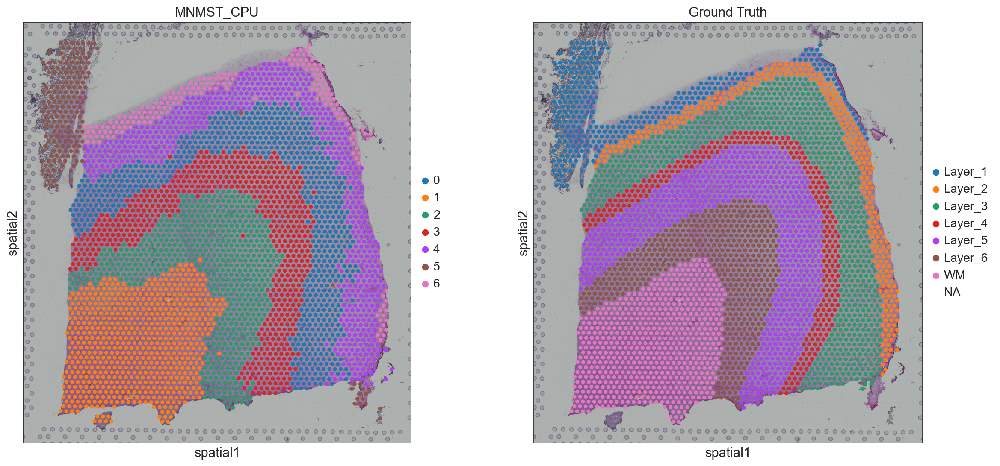

In [14]:
key_added = 'representation'
conns_key = 'representation'
dists_key = 'representation'

enhanced_data.uns[key_added] = {}
    
representation_dict = enhanced_data.uns[key_added]
    
representation_dict['connectivities_key'] = conns_key
representation_dict['distances_key'] = dists_key
representation_dict['var_names_use'] = enhanced_data.var_names.to_numpy()
    
representation_dict['params'] = {}
representation_dict['params']['method'] = 'umap'
enhanced_data.obsp['representation'] = Z
sc.tl.leiden(enhanced_data, neighbors_key='representation', resolution=1.4, key_added='MNMST_CPU')
display(enhanced_data.obs['MNMST_CPU'])
sc.pl.spatial(enhanced_data, color=['MNMST_CPU', 'Ground Truth'])

## We also provide the torch version of MNMST, which proves that parallel computing effectively accelerates the execution efficiency of MNMST.

In [15]:
start_time = time.time()

In [16]:
# First, we convert the numpy data into tensor
from MNMST_gpu import sparse_self_representation_torch
import torch

device = torch.device('cuda') if torch.cuda.is_available() else 'cpu'
cos_init_tensor = torch.from_numpy(cos_init).float().to(device)
x_tensor = torch.from_numpy(low_dim_x.T).to(device)

### First, MNMST construct expression network by using Self-Representation Learning (SRL) algorithm

In [17]:
C_gpu = sparse_self_representation_torch(x_tensor, init_w=cos_init_tensor, alpha=1., beta=1., device=device)

# Epoch 99, loss: 862.586: 100%|██████████| 100/100 [00:01<00:00, 62.33it/s]


# And, based on the constructed expression network and spatial network, MNMST performs joint matrix factorization and affinity graph learning:
$$
\|W^{[e]} - BF^{[e]}\|^2 + \|M^{[s]} - BF^{[s]}\|^2 + \gamma \|Z\|_* + \lambda \|E\|_{2,1}
$$

In [18]:
from MNMST_gpu import MNMST_representation_gpu

spatia_init_tensor = torch.from_numpy(weights_graph.A).float().to(device)

Z_gpu = MNMST_representation_gpu(C_gpu, spatia_init_tensor, device=device)

# Epoch 19, loss: 0.112:  20%|██        | 20/100 [00:02<00:08,  9.50it/s]


In [19]:
end_time = time.time()

### Convert the Tensor object to Numpy

In [20]:
Z_gpu = Z_gpu.detach().cpu().numpy()

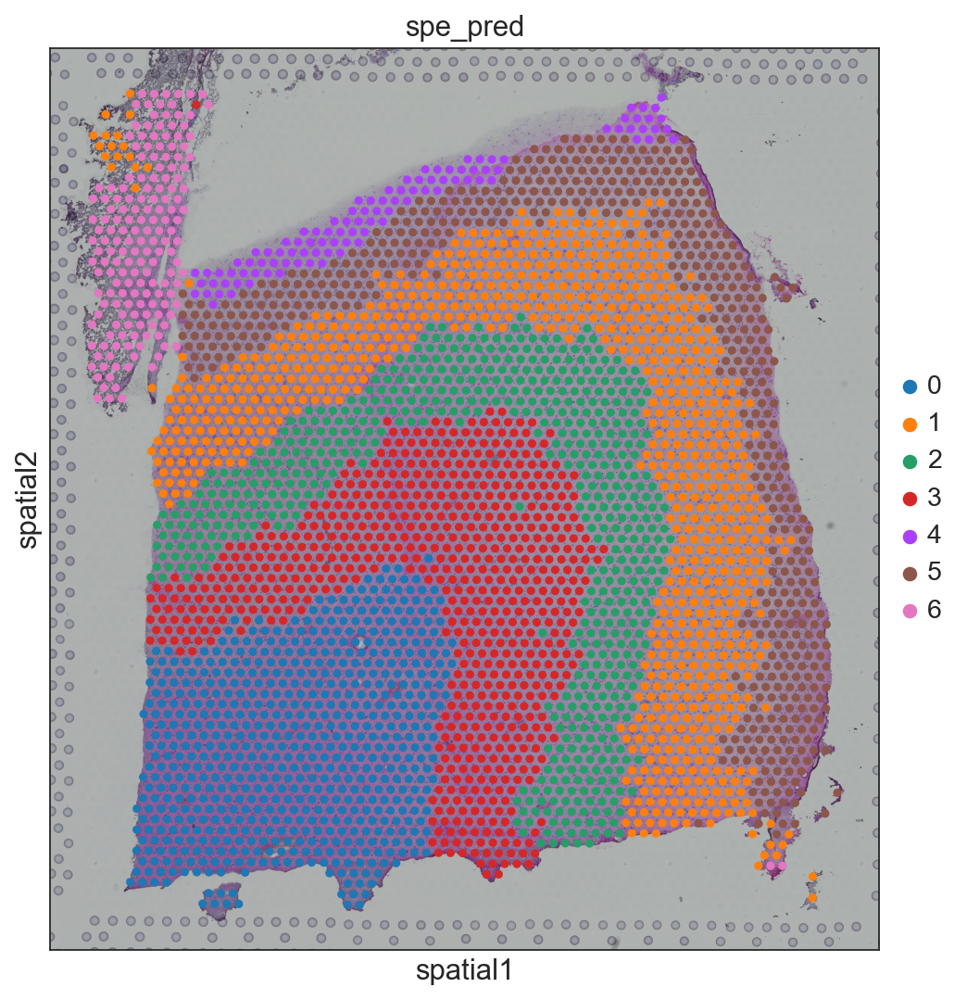

In [21]:

from sklearn.cluster import SpectralClustering

n_clusters = 7  # 你可以根据需要设置聚类的数量
spectral = SpectralClustering(n_clusters=n_clusters, affinity='precomputed')
labels = spectral.fit_predict(Z_gpu)

enhanced_data.obs['spe_pred'] = labels
enhanced_data.obs["spe_pred"] = enhanced_data.obs["spe_pred"].astype('int')
enhanced_data.obs['spe_pred'] = enhanced_data.obs['spe_pred'].astype('category')
sc.pl.spatial(enhanced_data, color=['spe_pred'])

running Leiden clustering
    finished: found 7 clusters and added
    'MNMST_GPU', the cluster labels (adata.obs, categorical) (0:00:11)
AAACAACGAATAGTTC-1    5
AAACAAGTATCTCCCA-1    0
AAACACCAATAACTGC-1    1
AAACAGAGCGACTCCT-1    4
AAACAGGGTCTATATT-1    2
                     ..
TTGTTGTGTGTCAAGA-1    3
TTGTTTCACATCCAGG-1    1
TTGTTTCATTAGTCTA-1    1
TTGTTTCCATACAACT-1    2
TTGTTTGTATTACACG-1    1
Name: MNMST_GPU, Length: 3592, dtype: category
Categories (7, object): ['0', '1', '2', '3', '4', '5', '6']


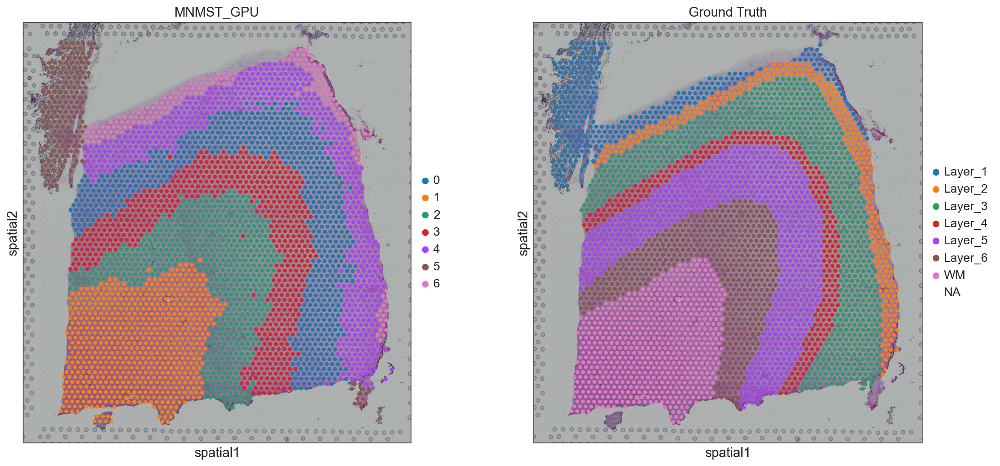

In [22]:
key_added = 'representation'
conns_key = 'representation'
dists_key = 'representation'

enhanced_data.uns[key_added] = {}
    
representation_dict = enhanced_data.uns[key_added]
    
representation_dict['connectivities_key'] = conns_key
representation_dict['distances_key'] = dists_key
representation_dict['var_names_use'] = enhanced_data.var_names.to_numpy()
    
representation_dict['params'] = {}
representation_dict['params']['method'] = 'umap'
enhanced_data.obsp['representation'] = Z_gpu
sc.tl.leiden(enhanced_data, neighbors_key='representation', resolution=1.4, key_added='MNMST_GPU')
print(enhanced_data.obs['MNMST_GPU'])
sc.pl.spatial(enhanced_data, color=['MNMST_GPU', 'Ground Truth'])

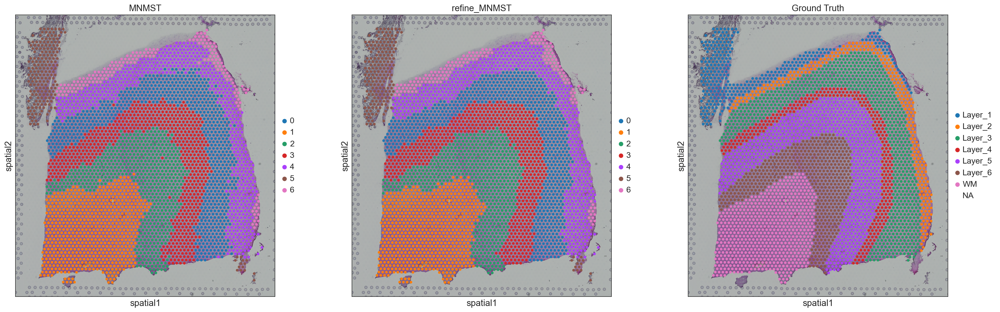

In [23]:
refined_pred = refine(sample_id=enhanced_data.obs.index.tolist(), pred=enhanced_data.obs["MNMST_GPU"].tolist(), dis=weights_graph.A, shape="hexagon")
enhanced_data.obs["refined_pred"] = refined_pred
enhanced_data.obs["refined_pred"] = enhanced_data.obs["refined_pred"].astype('category')
sc.pl.spatial(enhanced_data, color=['MNMST_GPU', 'refined_pred', 'Ground Truth'], title=['MNMST', 'refine_MNMST', 'Ground Truth'])

In [24]:
elapsed_time_minutes = (end_time - start_time) / 60
ALL_memory_usage_gb = record_memory_usage()
print(f"time executing is: {elapsed_time_minutes:.2f} mins")
print(f"memory executing is: {(ALL_memory_usage_gb - final_memory_usage_gb):.2f} GB")

time executing is: 0.08 mins
memory executing is: 2.84 GB


### Our device information

In [25]:
import psutil

cpu_info = f"CPU: {psutil.cpu_count(logical=False)} cores, {psutil.cpu_count()} threads"

gpu_info = "GPU: "
if torch.cuda.is_available():
    gpu_count = torch.cuda.device_count()
    for i in range(gpu_count):
        gpu_info += f"GPU {i + 1}: {torch.cuda.get_device_name(i)}, "
    gpu_info = gpu_info[:-2]
else:
    gpu_info += "No GPU available."

print(cpu_info)
print(gpu_info)


CPU: 24 cores, 32 threads
GPU: GPU 1: NVIDIA GeForce RTX 4090
